**SALARY PREDICTION**

Introduction to the Salaries Dataset This dataset provides detailed information on salaries for various data-related job roles across different industries, regions, and experience levels. It is designed to support analyses of compensation trends within the tech and data sectors, helping stakeholders understand how factors like job title, location, experience level, and company size impact salary distribution.

Dataset Overview: work_year: The year in which the salary data was recorded.

experience_level: The level of experience of the employee (e.g., entry-level, mid-level, senior, executive).

employment_type: The nature of the employment contract (e.g., full-time, part-time, contract, freelance).

job_title: The specific role or title of the employee (e.g., Data Scientist, Machine Learning Engineer, BI Analyst).

salary: The employee’s salary in their local currency.

salary_currency: The currency in which the salary is paid.

salary_in_usd: The standardized salary converted into US dollars for consistent comparison.

employee_residence: The country of residence of the employee.

remote_ratio: The proportion of remote work (0 = on-site, 50 = hybrid, 100 = fully remote).

company_location: The country where the employing company is based.

company_size: The size of the company (Small, Medium, or Large).

In [ ]:
import pandas as pd  # For working with data in tables (like Excel)
import numpy as np  # For numerical operations and handling arrays
import matplotlib.pyplot as plt  # For creating graphs and visualizations
import seaborn as sns  # For making prettier and more informative plots

from sklearn.preprocessing import OneHotEncoder  # To convert categorical values into numbers using 0s and 1s
from sklearn.preprocessing import PowerTransformer  # To fix skewness and normalize data
from scipy.stats import skew  # To measure how skewed a distribution is

from sklearn.feature_selection import SelectKBest, f_regression  # To pick the most important features for prediction

from sklearn.model_selection import train_test_split  # To split data into training and testing sets

from sklearn.preprocessing import StandardScaler  # To scale features so they’re on the same level

from sklearn.linear_model import LinearRegression  # To build a simple model that finds a straight-line relationship
from sklearn.ensemble import RandomForestRegressor  # A more powerful model using many decision trees
from sklearn.tree import DecisionTreeRegressor  # A model that splits data like a flowchart to make predictions
from sklearn.svm import SVR  # A model that tries to fit the data with a flexible curve (Support Vector Regression)

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error  # Tools to measure how well the model did


In [ ]:
data=pd.read_csv('/content/salaries.csv')

In [ ]:
df=pd.DataFrame(data)

In [ ]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,MI,FT,Customer Success Manager,57000,EUR,60000,NL,50,NL,L
1,2025,SE,FT,Engineer,165000,USD,165000,US,0,US,M
2,2025,SE,FT,Engineer,109000,USD,109000,US,0,US,M
3,2025,SE,FT,Applied Scientist,294000,USD,294000,US,0,US,M
4,2025,SE,FT,Applied Scientist,137600,USD,137600,US,0,US,M


In [ ]:
df.tail()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
88579,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
88580,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
88581,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
88582,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L
88583,2021,SE,FT,Data Scientist,7000000,INR,94665,IN,50,IN,L


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88584 entries, 0 to 88583
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           88584 non-null  int64 
 1   experience_level    88584 non-null  object
 2   employment_type     88584 non-null  object
 3   job_title           88584 non-null  object
 4   salary              88584 non-null  int64 
 5   salary_currency     88584 non-null  object
 6   salary_in_usd       88584 non-null  int64 
 7   employee_residence  88584 non-null  object
 8   remote_ratio        88584 non-null  int64 
 9   company_location    88584 non-null  object
 10  company_size        88584 non-null  object
dtypes: int64(4), object(7)
memory usage: 7.4+ MB


In [ ]:
df.shape

(88584, 11)

In [ ]:
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [ ]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,88584.000000,8.858400e+04,88584.000000,88584.000000
mean,2024.034758,1.619323e+05,157567.798417,21.286011
std,0.620370,1.965317e+05,73531.373158,40.831018
min,2020.000000,1.400000e+04,15000.000000,0.000000
25%,2024.000000,1.060000e+05,106097.250000,0.000000
50%,2024.000000,1.470000e+05,146307.000000,0.000000
75%,2024.000000,1.995000e+05,198600.000000,0.000000
max,2025.000000,3.040000e+07,800000.000000,100.000000


In [ ]:
df.isnull().sum()

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [ ]:
df.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
88579,False
88580,False
88581,False
88582,False


In [ ]:
df.duplicated().sum()

np.int64(44340)

In [ ]:
df=df.drop_duplicates()

In [ ]:
df.shape

(44244, 11)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
df_pandas_encoded=pd.get_dummies(df,columns=['experience_level','employment_type','job_title','salary_currency','employee_residence','company_location','company_size'],drop_first=True)

In [ ]:
encoder=OneHotEncoder(sparse_output=False)

In [ ]:
categorical_columns=df.select_dtypes(include=['object']).columns.tolist()
categorical_columns

['experience_level',
 'employment_type',
 'job_title',
 'salary_currency',
 'employee_residence',
 'company_location',
 'company_size']

In [ ]:
ohe=encoder.fit_transform(df[categorical_columns])

In [ ]:
oh_df=pd.DataFrame(ohe,columns=encoder.get_feature_names_out(categorical_columns))

In [ ]:
df_sklearn_encoded=pd.concat([df.drop(categorical_columns,axis=1),oh_df],axis=1)

In [ ]:
df= df_sklearn_encoded

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 61711 entries, 0 to 44242
Columns: 539 entries, work_year to company_size_S
dtypes: float64(539)
memory usage: 254.2 MB


In [ ]:
df.duplicated().sum()

np.int64(27037)

In [ ]:
df=df.drop_duplicates()

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.shape

(34674, 539)

In [ ]:
df.isnull().sum()

,0
work_year,1718
salary,1718
salary_in_usd,1718
remote_ratio,1718
experience_level_EN,7934
...,...
company_location_ZA,7934
company_location_ZM,7934
company_size_L,7934
company_size_M,7934


In [ ]:
df=df.dropna()

In [ ]:
df.shape

(25022, 539)

In [ ]:
df.isnull().sum()

,0
work_year,0
salary,0
salary_in_usd,0
remote_ratio,0
experience_level_EN,0
...,...
company_location_ZA,0
company_location_ZM,0
company_size_L,0
company_size_M,0


In [ ]:
num_columns=df.select_dtypes(include='number')
num_columns.head()

,work_year,salary,salary_in_usd,remote_ratio,experience_level_EN,experience_level_EX,experience_level_MI,experience_level_SE,employment_type_CT,employment_type_FL,...,company_location_UA,company_location_US,company_location_VE,company_location_VN,company_location_XK,company_location_ZA,company_location_ZM,company_size_L,company_size_M,company_size_S
0,2025.0,57000.0,60000.0,50.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2025.0,165000.0,165000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2025.0,109000.0,109000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,2025.0,294000.0,294000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2025.0,137600.0,137600.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


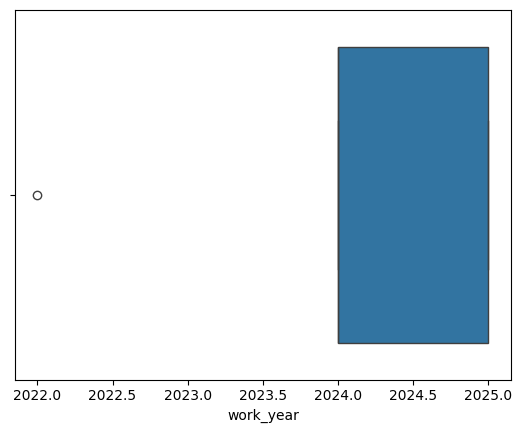

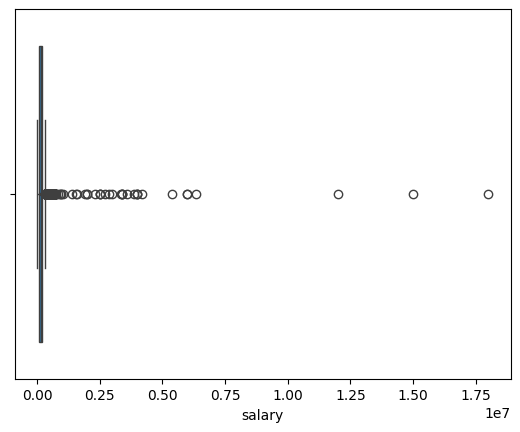

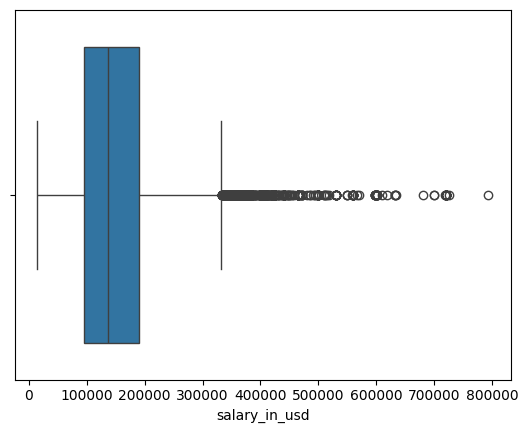

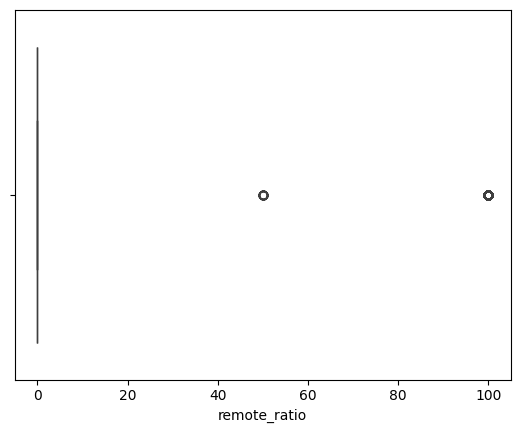

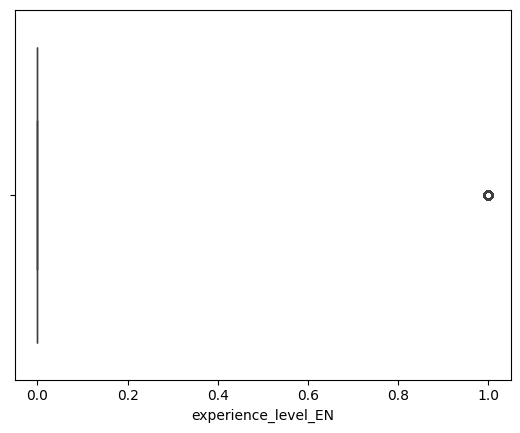

...

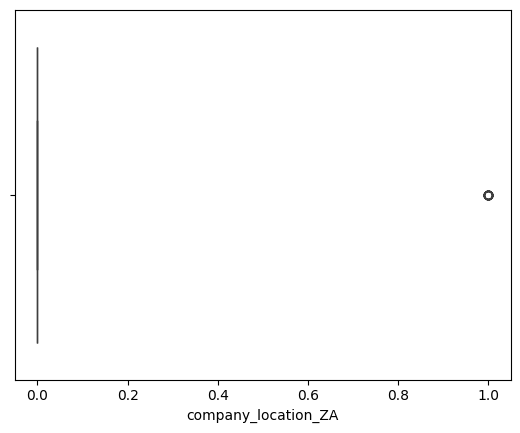

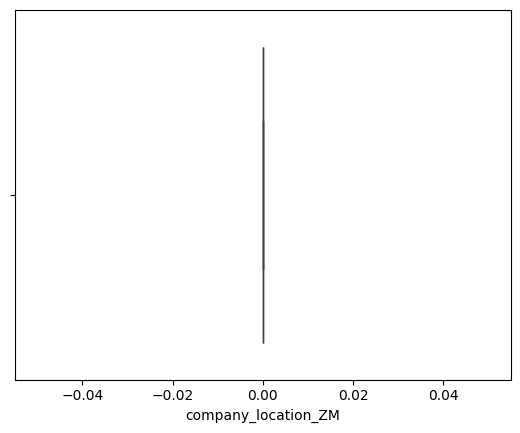

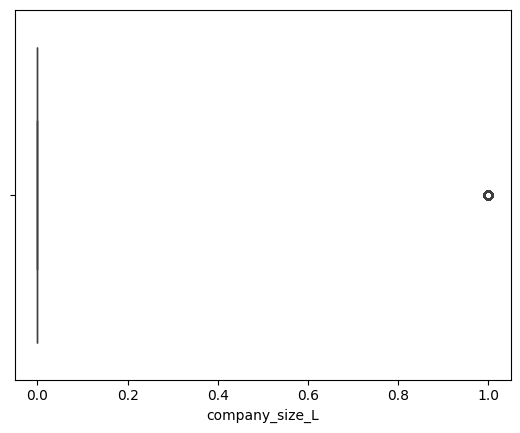

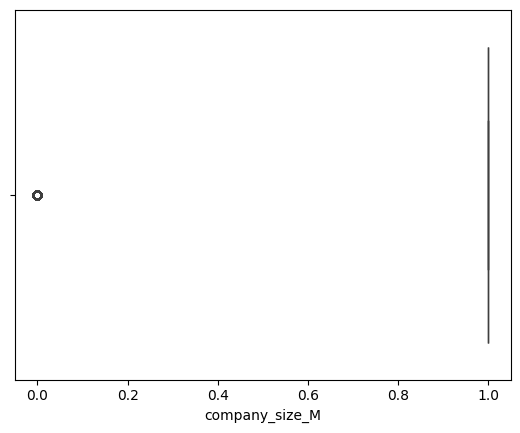

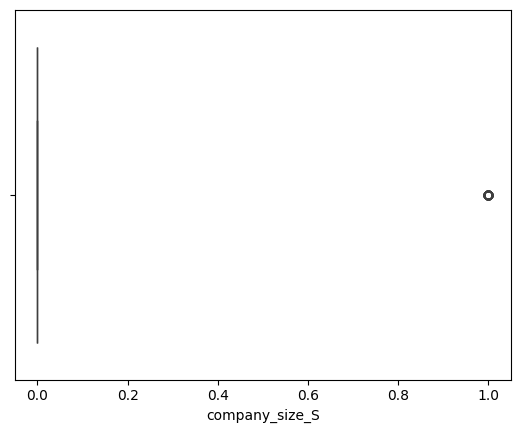

In [ ]:
for column in num_columns:
  sns.boxplot(data=num_columns,x=column)
  plt.show()

**HANDLING OUTLIERS**

In [ ]:
def handling_outliers(df):

    for col in df.select_dtypes(include='number').columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)
    return df

<Axes: >

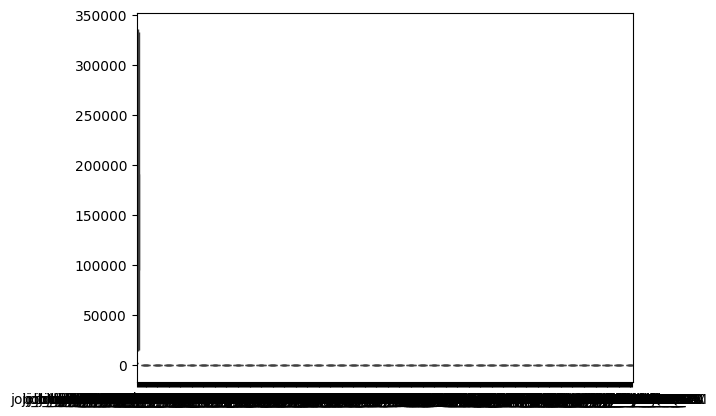

In [ ]:
df=handling_outliers(df)
df.head()
sns.boxplot(data=df)

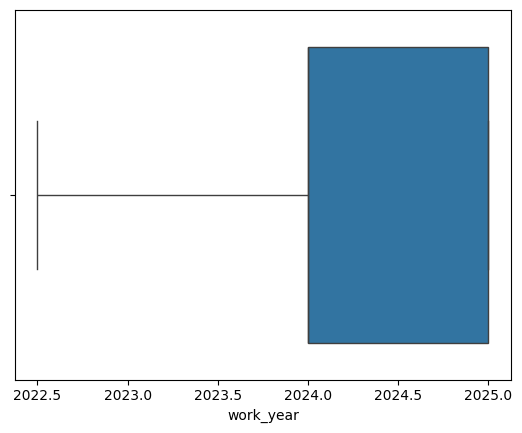

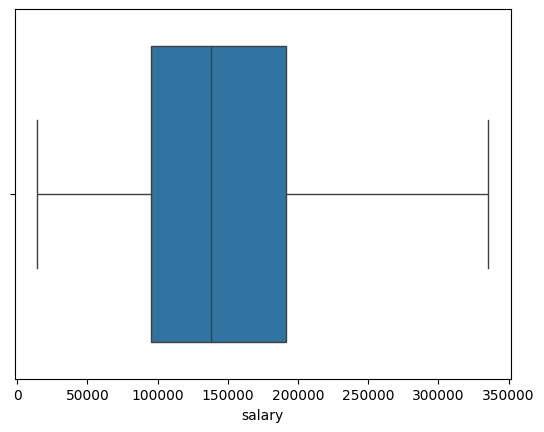

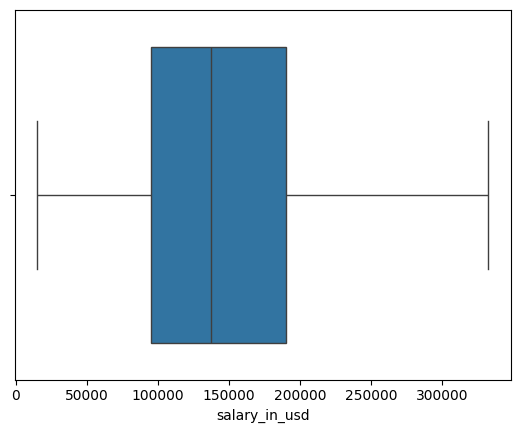

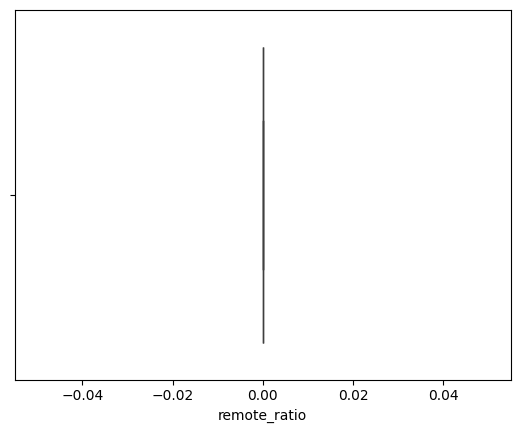

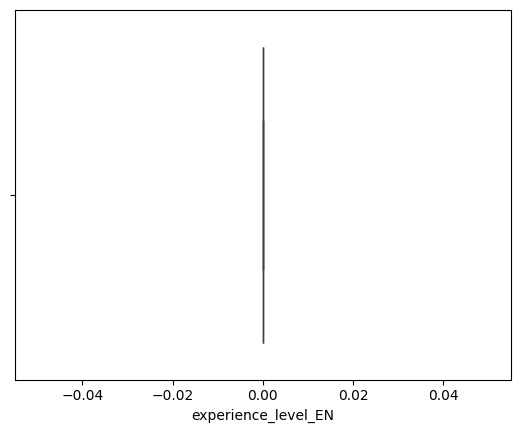

...

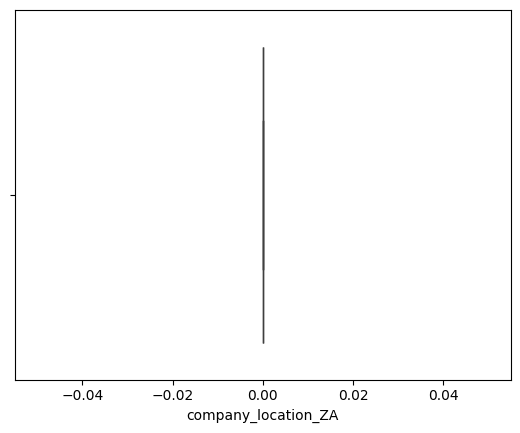

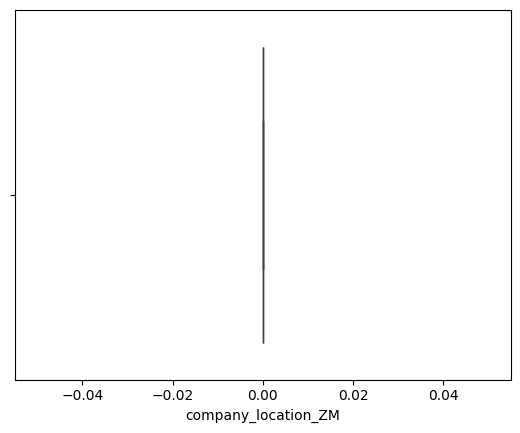

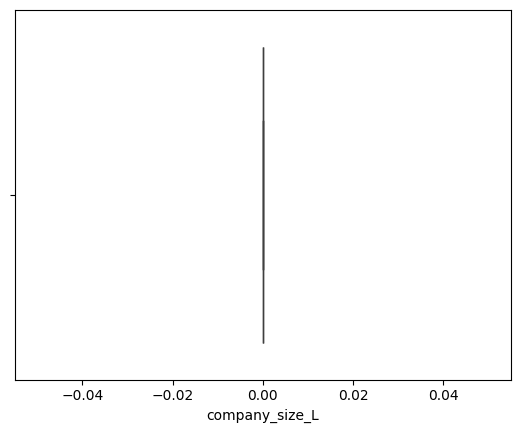

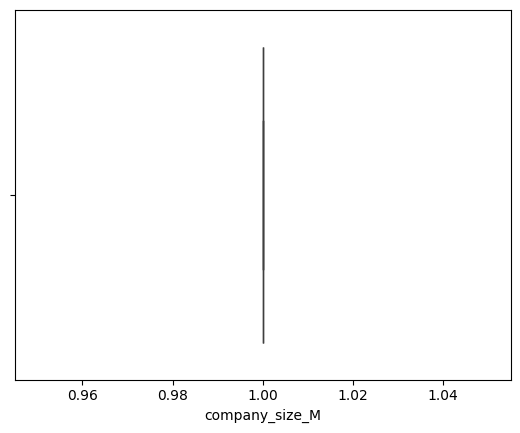

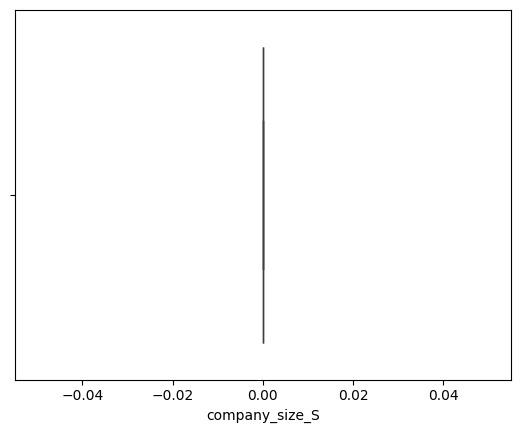

In [ ]:
for column in num_columns:
  sns.boxplot(data=df,x=column)
  plt.show()

**VISUALIZATION**

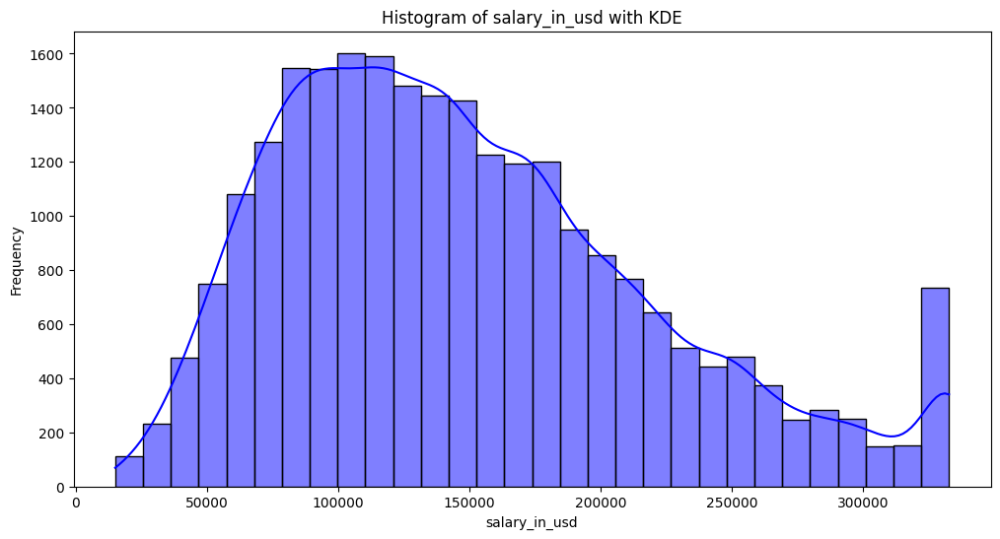

In [ ]:
#HISTOGRAM
plt.figure(figsize=(12, 6))
sns.histplot(df["salary_in_usd"], kde=True, bins=30, color='blue')
plt.title("Histogram of salary_in_usd with KDE")
plt.xlabel("salary_in_usd")
plt.ylabel("Frequency")
plt.show()

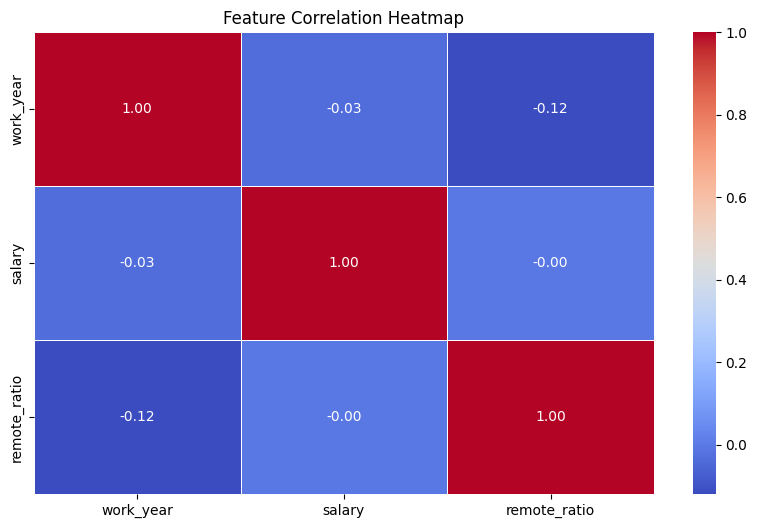

In [ ]:
#"HEAT MAP"
data['salary_in_usd'] = pd.to_datetime(df['salary_in_usd'], format='%d/%m/%Y', errors='coerce')
numerical_data = data.select_dtypes(include=['number'])
plt.figure(figsize=(10, 6))
sns.heatmap(numerical_data.corr(), annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

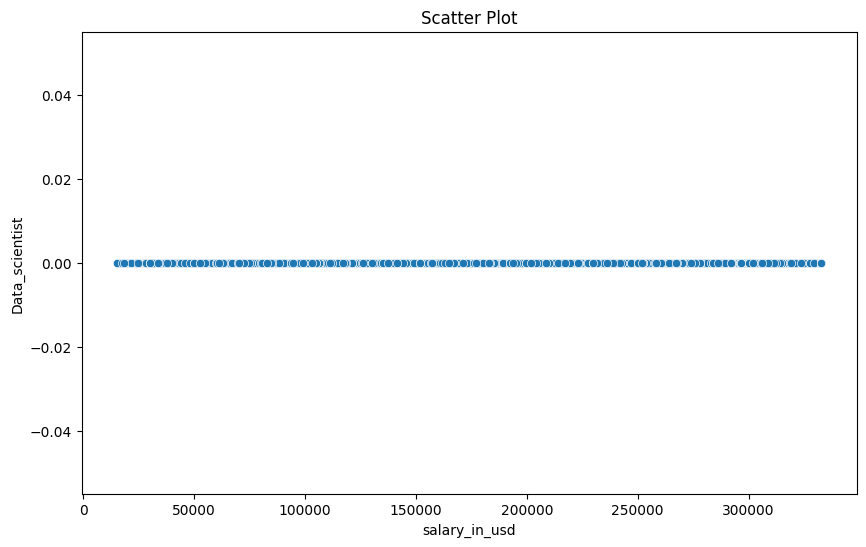

In [ ]:
#"SCATTER PLOT"
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df["salary_in_usd"], y=df["job_title_Data Scientist"])
plt.title("Scatter Plot")
plt.xlabel("salary_in_usd")
plt.ylabel("Data_scientist")
plt.show()

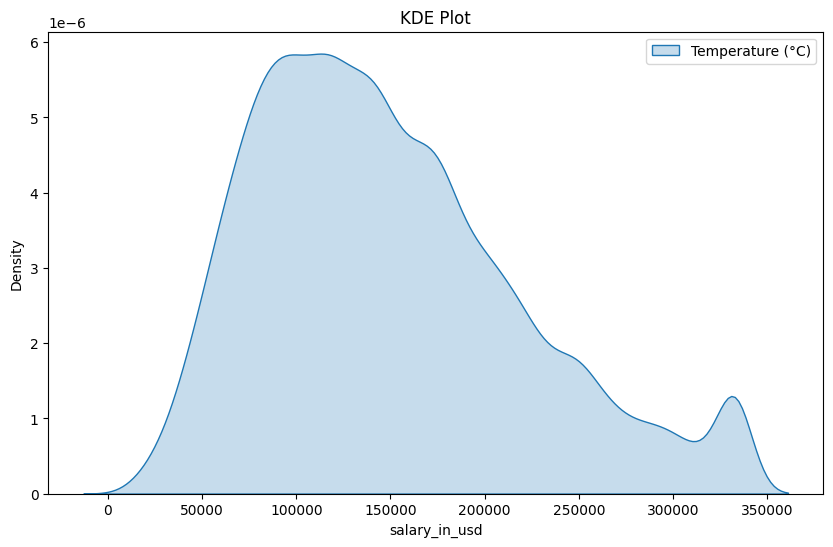

In [ ]:
#"KDE PLOT"
plt.figure(figsize=(10, 6))
sns.kdeplot(df["salary_in_usd"], label="Temperature (°C)", fill=True)
plt.legend()
plt.title("KDE Plot")
plt.show()

**HANDLING SKWENESS**

In [ ]:
cols_to_transform = ['salary_in_usd']
pt = PowerTransformer(method='yeo-johnson')
data[cols_to_transform] = pt.fit_transform(data[cols_to_transform])

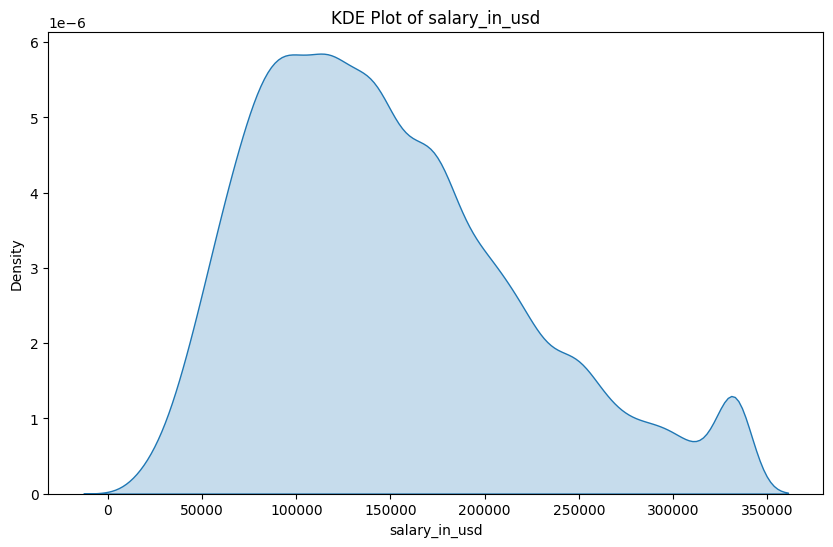

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(x='salary_in_usd', data=df, fill=True) #Update sns.kdeplot call
plt.title("KDE Plot of salary_in_usd")
plt.xlabel("salary_in_usd")
plt.ylabel("Density")
plt.show()

In [ ]:
for col in df.select_dtypes(include=['number']).columns:
    print(f"{col} Skewness: {skew(df[col]):.4f}")

work_year Skewness: 0.4153
salary Skewness: 0.6909
salary_in_usd Skewness: 0.6952
remote_ratio Skewness: nan
experience_level_EN Skewness: nan
experience_level_EX Skewness: nan
experience_level_MI Skewness: 0.7314
experience_level_SE Skewness: -0.0739
employment_type_CT Skewness: nan
employment_type_FL Skewness: nan
employment_type_FT Skewness: nan
employment_type_PT Skewness: nan
job_title_AI Architect Skewness: nan
job_title_AI Data Engineer Skewness: nan
job_title_AI Data Scientist Skewness: nan
job_title_AI Developer Skewness: nan
job_title_AI Engineer Skewness: nan
job_title_AI Engineering Manager Skewness: nan
job_title_AI Governance Lead Skewness: nan
job_title_AI Lead Skewness: nan
job_title_AI Machine Learning Engineer Skewness: nan
job_title_AI Product Manager Skewness: nan
job_title_AI Product Owner Skewness: nan
job_title_AI Programmer Skewness: nan
job_title_AI Research Engineer Skewness: nan
job_title_AI Research Scientist Skewness: nan
job_title_AI Researcher Skewness: n

<ipython-input-90-53e5bbfe8c59>:2: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  print(f"{col} Skewness: {skew(df[col]):.4f}")


job_title_Chatbot Developer Skewness: nan
job_title_Clinical Data Operator Skewness: nan
job_title_Cloud Data Architect Skewness: nan
job_title_Cloud Data Engineer Skewness: nan
job_title_Cloud Database Administrator Skewness: nan
job_title_Cloud Database Engineer Skewness: nan
job_title_Cloud Developer Skewness: nan
job_title_Cloud Engineer Skewness: nan
job_title_Compliance Data Analyst Skewness: nan
job_title_Computational Biologist Skewness: nan
job_title_Computational Scientist Skewness: nan
job_title_Computer Vision Engineer Skewness: nan
job_title_Computer Vision Software Engineer Skewness: nan
job_title_Consultant Skewness: nan
job_title_Consultant Data Engineer Skewness: nan
job_title_Controls Engineer Skewness: nan
job_title_Customer Success Manager Skewness: nan
job_title_Data Analyst Skewness: nan
job_title_Data Analyst Lead Skewness: nan
job_title_Data Analytics Associate Skewness: nan
job_title_Data Analytics Consultant Skewness: nan
job_title_Data Analytics Developer Ske

**FEATURE SELECTION**

In [ ]:
x=df.drop(columns=['salary_in_usd'],axis=1)
y=df['salary_in_usd']

In [ ]:
selecter=SelectKBest(score_func=f_regression,k=6)
x_new=selecter.fit_transform(x,y)
selected_feature=x.columns[selecter.get_support()]
feature_score=pd.DataFrame({'Feature':x.columns,'Score':selecter.scores_}).sort_values(by='Score',ascending=False)
print(feature_score)

                                         Feature          Score
1                                         salary  521665.265438
0                                      work_year       6.895760
5                            experience_level_MI       0.403291
6                            experience_level_SE       0.064058
355                        employee_residence_AU       0.000000
..                                           ...            ...
182                    job_title_DevOps Engineer       0.000000
183                          job_title_Developer       0.000000
184                 job_title_Developer Advocate       0.000000
185  job_title_Director of Business Intelligence       0.000000
177             job_title_Database Administrator       0.000000

[538 rows x 2 columns]


In [ ]:
x_selected=x[selected_feature]
x_selected.head()

,work_year,salary,experience_level_MI,experience_level_SE,company_size_M,company_size_S
0,2025.0,57000.0,1.0,0.0,1.0,0.0
1,2025.0,165000.0,0.0,1.0,1.0,0.0
2,2025.0,109000.0,0.0,1.0,1.0,0.0
3,2025.0,294000.0,0.0,1.0,1.0,0.0
4,2025.0,137600.0,0.0,1.0,1.0,0.0


**TRAIN TEST SPLIT**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_selected, y, test_size=0.2, random_state=42)
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", y_train.shape)
print("Testing target shape:", y_test.shape)

Training features shape: (20017, 6)
Testing features shape: (5005, 6)
Training target shape: (20017,)
Testing target shape: (5005,)


**SCALER**

In [ ]:
Ss=StandardScaler()
x_test_scaled=Ss.fit_transform(X_test)
x_train_scaled=Ss.fit_transform(X_train)

**BUILDING AND MODEL EVALUATION**

In [ ]:
print("\n Training Models")
models={
    'Linear Regression':LinearRegression(),
    'Random Forest':RandomForestRegressor(),
    'Decision Tree':DecisionTreeRegressor(),
    'SVR':SVR()
}


 Training Models


In [ ]:
result={}
for name,model in models.items():
  print(f"Training {name}")
  model.fit(x_train_scaled,y_train)
  y_pred=model.predict(x_test_scaled)

  result[name]={
      'MSE':mean_squared_error(y_test,y_pred),
      'MAE':mean_absolute_error(y_test,y_pred),
      'R2':r2_score(y_test,y_pred)
  }


Training Linear Regression
Training Random Forest
Training Decision Tree
Training SVR


In [ ]:
print("\n Model Evaluation")
for model_name,metrics in result.items():
  print(f"{model_name}:")
  for metric_name,metric_value in metrics.items():
    print(f"{metric_name}:{metric_value}")


 Model Evaluation
Linear Regression:
MSE:223357172.42471942
MAE:3311.328575517598
R2:0.9555095776027877
Random Forest:
MSE:221750998.45745105
MAE:3249.0116535111115
R2:0.9558295107281556
Decision Tree:
MSE:238423544.7089218
MAE:3320.0827496698334
R2:0.9525085131657648
SVR:
MSE:4965752737.5852785
MAE:55331.641523331054
R2:0.010873774873988329


In [ ]:
print("the best model random forest")

the best model random forest
